## Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import folium
import geopandas

np.set_printoptions(suppress=True)
pd.set_option('display.float_format', '{:.2f}'.format)

## Funções

In [2]:
# Criação de Mapa por localização
def point_map(df):
    houses = df[['id', 'latitude', 'longitude', 'price', 'rentability','number_of_reviews', 'availability_365','room_type']]
    fig = px.scatter_mapbox(data_frame=houses, lat='latitude', lon='longitude', color='room_type', text=None, hover_name=None, 
                            hover_data={'room_type':True,'rentability': True, 'latitude': False, 'longitude': False,'number_of_reviews': True,}, 
                  custom_data=None, size='number_of_reviews', animation_frame=None, animation_group=None, category_orders=None, 
                  labels={'room_type': 'Tipo de imóvel', 'number_of_reviews': 'N° de Reviews','rentability': 'Rentabilidade'}, color_discrete_sequence=None, color_discrete_map=None, color_continuous_scale=None, 
                  range_color=None, color_continuous_midpoint=None, opacity=None, size_max=15, zoom=10, center=None, 
                  mapbox_style='open-street-map', title='AB_NYC_2019', template=None, width=None, height=600)
    fig.update_layout(margin = {'r':0, 't':0,'l':0,'b':0})
    fig.show()    
    return None

# Criação de Gráfico de Barras por Média
def create_sns_bargraph_mean(df, x, y, title):
    df_graph = df[[x,y]].groupby(by=x).mean().sort_values(by=y, ascending = False).head(10).reset_index()
    fig1 = plt.figure(figsize=[15,10])
    ax1 = sns.barplot(data=df_graph, x=x, y=y)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(title) 
    for i in ax1.containers:
        ax1.bar_label(i,)
    return plt.show(ax1)

# Criação de Gráfico de Barras por Soma
def create_sns_bargraph_sum(df, x, y, title):
    df_graph = df[[x,y]].groupby(by=x).sum().sort_values(by=y, ascending = False).head(10).reset_index()
    fig1 = plt.figure(figsize=[15,10])
    ax1 = sns.barplot(data=df_graph, x=x, y=y)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(title) 
    for i in ax1.containers:
        ax1.bar_label(i,)
    return plt.show(ax1)

# Criação de Mapa de Calor por rentabilidade
def price_map(df,geofile):
    df_map = df[['neighbourhood_group','rentability']].groupby(by='neighbourhood_group').mean().sort_values(by='rentability').reset_index()
    m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], default_zoom_start=15)
    folium.Choropleth(
    geo_data=geofile,
    name='choropleth',
    data=df_map, 
    columns=['neighbourhood_group', 'rentability'], 
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2, 
    legend_name='AVG RENTABILITY').add_to(m)
    return m

# Criação de Gráfico de Barras em PX
def create_px_bargraph (df,x,y,color,title,text,unit1,unit2):
    df_graph = df[[x,y]].groupby(by=x).mean().sort_values(by=y).reset_index()
    fig = px.bar(df_graph, x=x, y=y, color= color, 
             title= title, text=text,
             color_discrete_map={'Brooklyn':'PeachPuff','Bronx':'cadetblue','Manhattan':'darkseagreen','Queens':'LightSkyBlue','Staten Island':'lightcoral'})
    fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
    fig.update_traces(texttemplate=unit1 + '%{text:.3s}'+unit2, textposition='outside')
    fig.show()
    return None

# Criação de CatPlot
def create_px_catplot (df,x,y,col,kind,xlabel):
    fig = plt.figure(figsize=[25,20])
    ax1 = sns.catplot(
        data=df, x=x, y=y, col=col,ci=None,
        kind=kind)
    ax1.set_axis_labels("", xlabel)
    ax1.set_titles(col_template="{col_name}")
    for ax in ax1.axes.ravel():
        for c in ax.containers:
             ax.bar_label(c,fmt='%1.1f')
        ax.margins(y=0.2)
    plt.show(ax1)

# Import Geo File
def get_geofile(geofile_path):
    geofile = geopandas.read_file(geofile_path)
    return geofile

# Importação e entendimento dos dados

In [3]:
df = pd.read_csv('AB_NYC_2019.csv')

In [4]:
geofile_path = 'new-york-city-boroughs.geojson'
geofile = get_geofile(geofile_path)

In [5]:
df.head(20)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.65,-73.97,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.81,-73.94,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.69,-73.96,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.80,-73.94,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.75,-73.97,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.69,-73.96,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76,-73.98,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80,-73.97,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71,-73.99,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [6]:
df.shape

(48895, 16)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [8]:
df.isna().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

#### Verificamos que existem valores Nulos nas features last_review, reviews_per_month, name e host_name

In [9]:
df.describe(percentiles=(.25,.50,.75,.90,.99))

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,48895.00,38843.00,48895.00,48895.00
mean,19017143.24,67620010.65,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10983108.39,78610967.03,0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,2539.00,2438.00,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9471945.00,7822033.00,40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,19677284.00,30793816.00,40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,29152178.50,107434423.00,40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
90%,33990939.60,212811431.40,40.80,-73.91,269.00,28.00,70.00,3.63,5.00,337.00
99%,36238878.58,267711764.80,40.86,-73.78,799.00,45.00,214.00,7.20,232.00,365.00
max,36487245.00,274321313.00,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


# Preparação dos dados

In [10]:
# Criando nomes para imóveis sem nomes
df['name'] = df.apply(lambda x: x['neighbourhood']+ str(x['id']) if pd.isna(x['name']) == True else x['name'], axis=1)

In [11]:
# Criando nomes para hosts sem nomes
df['host_name'] = df.apply(lambda x: x['neighbourhood']+ str(x['host_id']) if pd.isna(x['host_name']) == True else x['host_name'], axis=1)

In [12]:
# Criando nova base de Dados retirando os imóveis considerados inativos (Sem número de Reviews e Com disponibilidade 0)
df_ativos = df[(df['number_of_reviews'] >= 1) & (df['availability_365'] != 0) ].copy()

In [13]:
#Criando Feature rentability (Calculando a rentabilidade de cada imóvel)
df_ativos['rentability'] = df_ativos.apply(lambda x: (x['price'] * (x['minimum_nights']+1) * x['number_of_reviews']) / np.sqrt(x['availability_365']), axis=1)                               

In [14]:
# Convertendo last_review para formato de data
df_ativos['last_review'] = pd.to_datetime(df_ativos['last_review'])

In [15]:
df_ativos.describe(percentiles=(.25,.50,.75,.90,.99))

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,rentability
count,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00,26155.00
mean,19320255.56,74574778.67,40.73,-73.95,149.89,6.59,38.19,1.81,6.99,170.61,2878.74
std,11210938.64,82617013.60,0.06,0.05,198.82,19.60,54.36,1.81,31.81,124.15,13483.72
min,2539.00,2571.00,40.51,-74.24,0.00,1.00,1.00,0.01,1.00,1.00,0.00
25%,9457277.50,7365834.00,40.69,-73.98,70.00,1.00,5.00,0.45,1.00,53.00,231.52
50%,20783233.00,35281088.00,40.72,-73.95,109.00,2.00,16.00,1.23,1.00,160.00,797.44
75%,29509166.50,131647128.00,40.76,-73.93,175.00,4.00,49.00,2.68,3.00,292.00,2492.88
90%,33652395.00,219517861.00,40.81,-73.89,270.00,28.00,106.00,4.13,7.00,346.00,5995.11
99%,35801830.04,265180454.84,40.87,-73.77,750.00,31.00,248.00,7.75,121.00,365.00,29794.06
max,36455809.00,273841667.00,40.91,-73.71,9999.00,1250.00,629.00,58.50,327.00,365.00,1090734.58


### Estaremos retirando os imóveis com rentabilidade maior que 29794.06, uma vez que estaremos considerando que esses imóveis possuem características muito específicas e que seriam difíceis ou impossíveis de replicar, atrapalhando a análise dos melhores bairros e tipo de imóveis a serem comprados

In [16]:
df_analise = df_ativos[df_ativos['rentability'] <= 29794.06].copy()

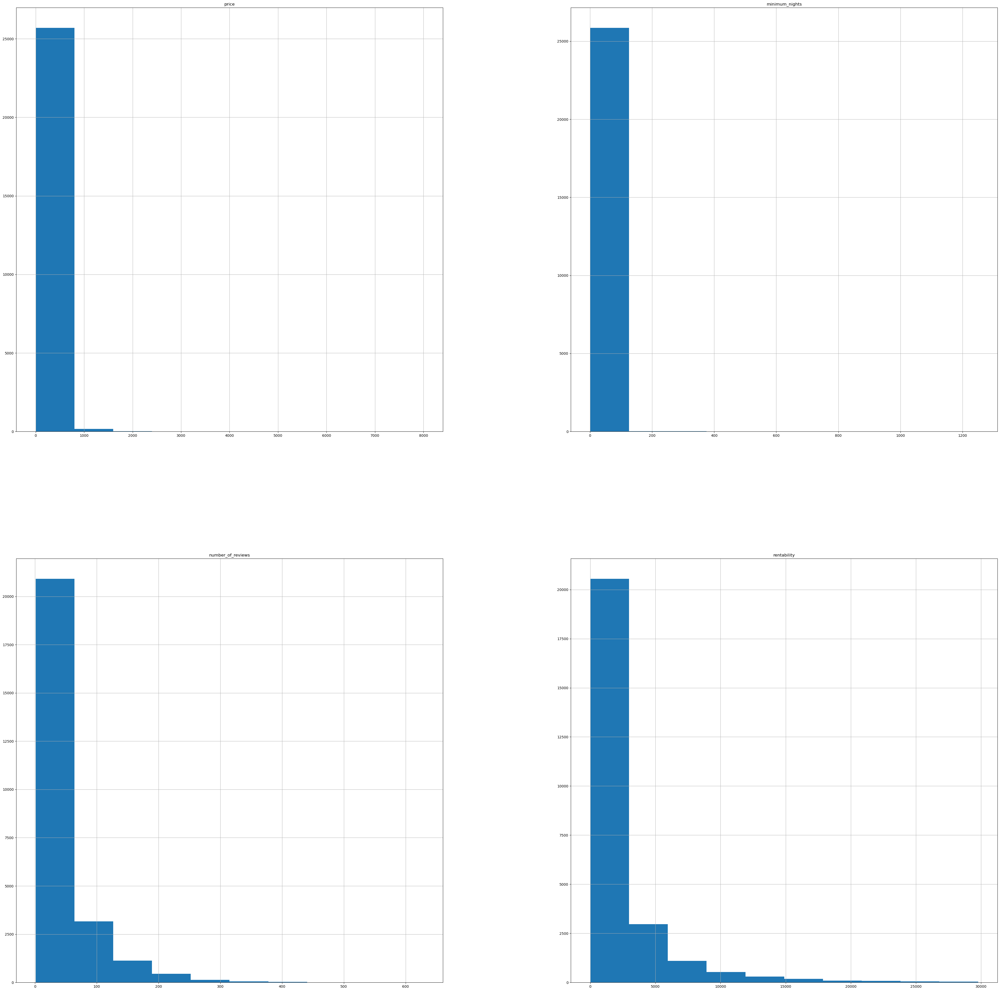

In [17]:
# Histogramas
df_analise[['price', 'minimum_nights','number_of_reviews','rentability']].hist(figsize=(50,50));

# Visualização dos dados

In [18]:
point_map(df_analise)

In [19]:
price_map(df_analise,geofile)

In [20]:
create_px_bargraph (df_analise,"neighbourhood_group","availability_365",'neighbourhood_group','Média de Disponibilidade x Regiões','availability_365',''," Days")

In [21]:
    create_px_bargraph (df_analise,"neighbourhood_group","price",'neighbourhood_group','Média de Preço x Regiões','price','$ ',"")

In [22]:
create_px_bargraph (df_analise,"room_type","rentability",'room_type','Média de Rentabilidade x Tipo de Quarto',"rentability","","")



In [ ]:
def create_px_catplot(df, x, y, col, kind, xlabel):
    sns.set(rc={'axes.facecolor': 'black',
                'figure.facecolor': 'black',
                'text.color': 'white',
                'xtick.color': 'white',
                'ytick.color': 'white',
                'axes.labelcolor': 'white'
                })
    ax1 = sns.catplot(
        data=df, x=x, y=y, col=col, ci=None,
        kind=kind, palette={'Brooklyn':'PeachPuff','Bronx':'cadetblue','Manhattan':'darkseagreen','Queens':'LightSkyBlue','Staten Island':'lightcoral'} )
    ax1.set_axis_labels("", xlabel)
    ax1.set_titles(col_template="{col_name}")
    for ax in ax1.axes.ravel():
        for c in ax.containers:
            ax.bar_label(c, fmt='%1.1f')
        ax.margins(y=0.2)
    st.pyplot(fig=ax1)
    return None

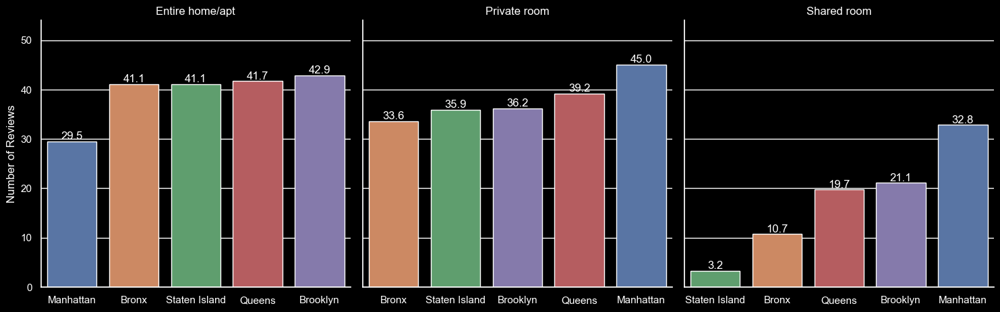

In [71]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

def create_px_catplot2(df, x, y, col, kind, xlabel):
    sns.set(rc={'axes.facecolor': 'black',
                'figure.facecolor': 'black',
                'text.color': 'white',
                'xtick.color': 'white',
                'ytick.color': 'white',
                'axes.labelcolor': 'white'
                })
    grouped_df = df[[x, col, y]].groupby(
                                                [x, col]
                                            ).mean().reset_index().sort_values(
                                                [col, y]
                                            )
    ax1 = sns.catplot(

        data=grouped_df, x=x, y=y, col=col,
        sharex=False,kind=kind, hue=x, dodge=False,
        palette={'Brooklyn':'PeachPuff','Bronx':'cadetblue','Manhattan':'darkseagreen','Queens':'LightSkyBlue','Staten Island':'lightcoral'} )
    ax1.set_axis_labels("", xlabel)
    ax1.set_titles(col_template="{col_name}")
    for ax in ax1.axes.ravel():
        for c in ax.containers:
            ax.bar_label(c, fmt='%1.1f')
            ax.margins(y=0.2)
    #st.pyplot(fig=ax1)
    plt.show()
    return None



create_px_catplot2(df_analise,"neighbourhood_group","rentability","room_type","bar", "Rentability")

C:\Users\Rafael\AppData\Local\Temp\ipykernel_12688\1872420434.py:68: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




<Figure size 2500x2000 with 0 Axes>

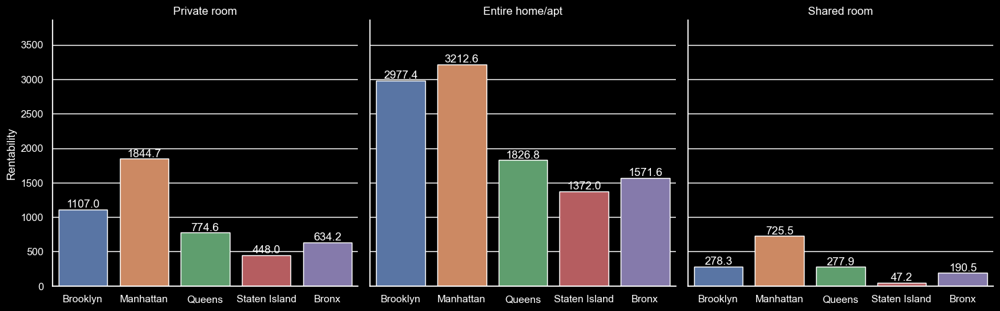

In [61]:
create_px_catplot(df_analise,"neighbourhood_group","rentability","room_type","bar", "Rentability")

In [65]:
grouped_df = df[['neighbourhood_group', 'room_type', 'price']].groupby(
                                                ['neighbourhood_group', 'room_type']
                                            ).mean().reset_index().sort_values(
                                                ['room_type', 'price']
                                            )
grouped_df

,neighbourhood_group,room_type,price
0,Bronx,Entire home/apt,127.51
9,Queens,Entire home/apt,147.05
12,Staten Island,Entire home/apt,173.85
3,Brooklyn,Entire home/apt,178.33
6,Manhattan,Entire home/apt,249.24
13,Staten Island,Private room,62.29
1,Bronx,Private room,66.79
10,Queens,Private room,71.76
4,Brooklyn,Private room,76.50
7,Manhattan,Private room,116.78


C:\Users\Rafael\AppData\Local\Temp\ipykernel_12688\1872420434.py:68: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




<Figure size 2500x2000 with 0 Axes>

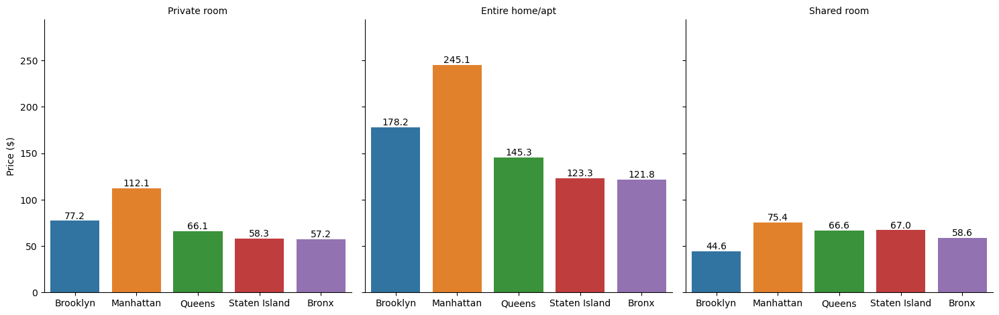

In [24]:
create_px_catplot(df_analise,"neighbourhood_group","price","room_type","bar", "Price ($)")

C:\Users\Rafael\AppData\Local\Temp\ipykernel_12688\1872420434.py:68: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




<Figure size 2500x2000 with 0 Axes>

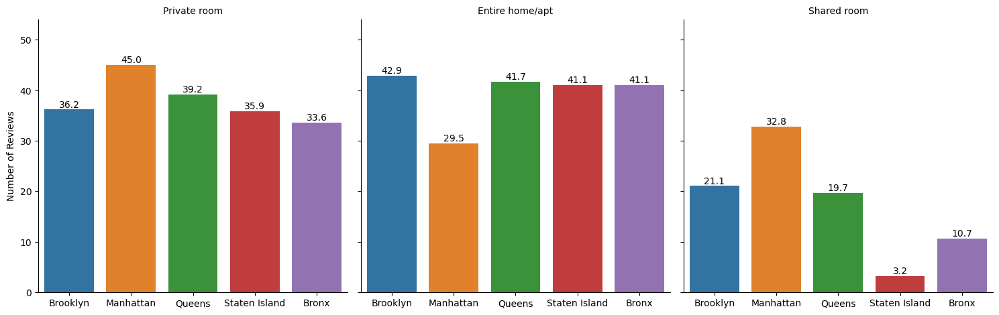

In [25]:
create_px_catplot(df_analise,"neighbourhood_group","number_of_reviews","room_type","bar","Number of Reviews")

C:\Users\Rafael\AppData\Local\Temp\ipykernel_12688\1872420434.py:68: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




<Figure size 2500x2000 with 0 Axes>

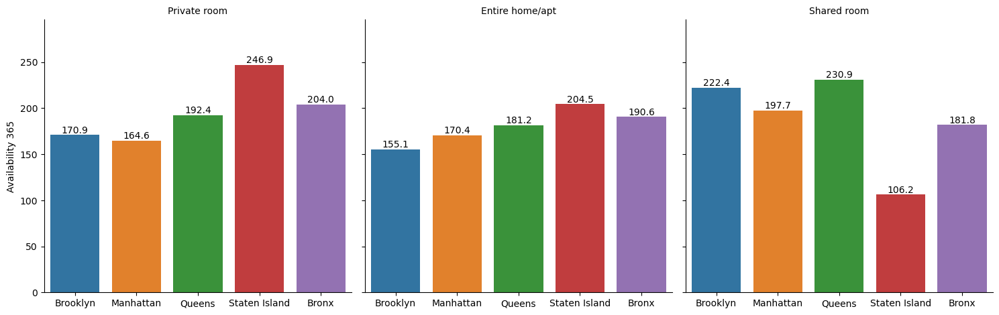

In [26]:
create_px_catplot(df_analise,"neighbourhood_group","availability_365","room_type","bar","Availability 365")

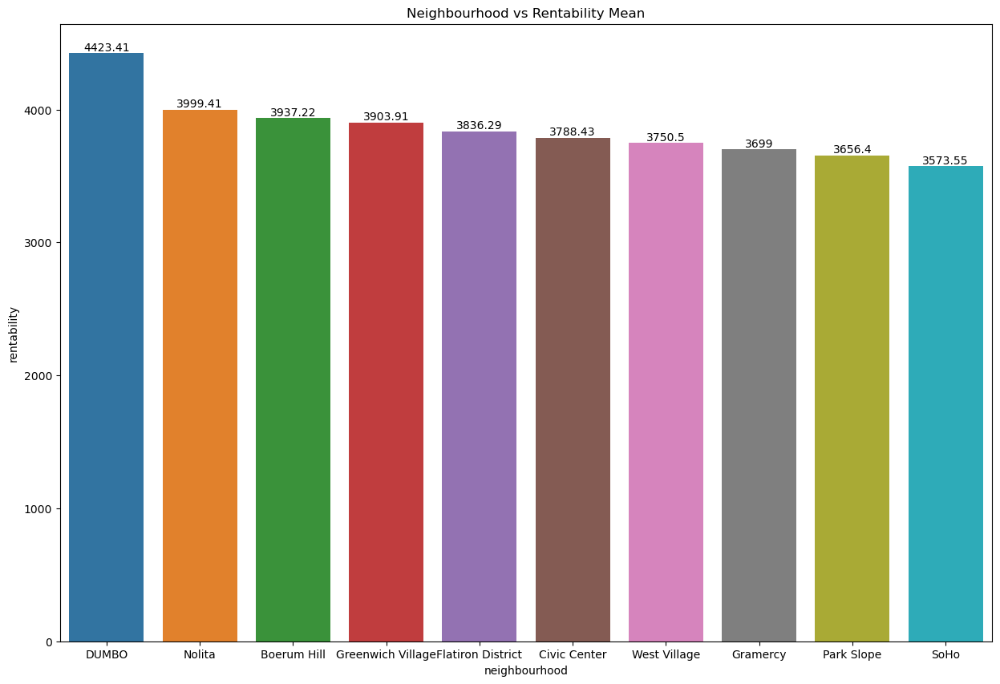

In [27]:
create_sns_bargraph_mean(df_analise, 'neighbourhood', 'rentability', "Neighbourhood vs Rentability Mean")

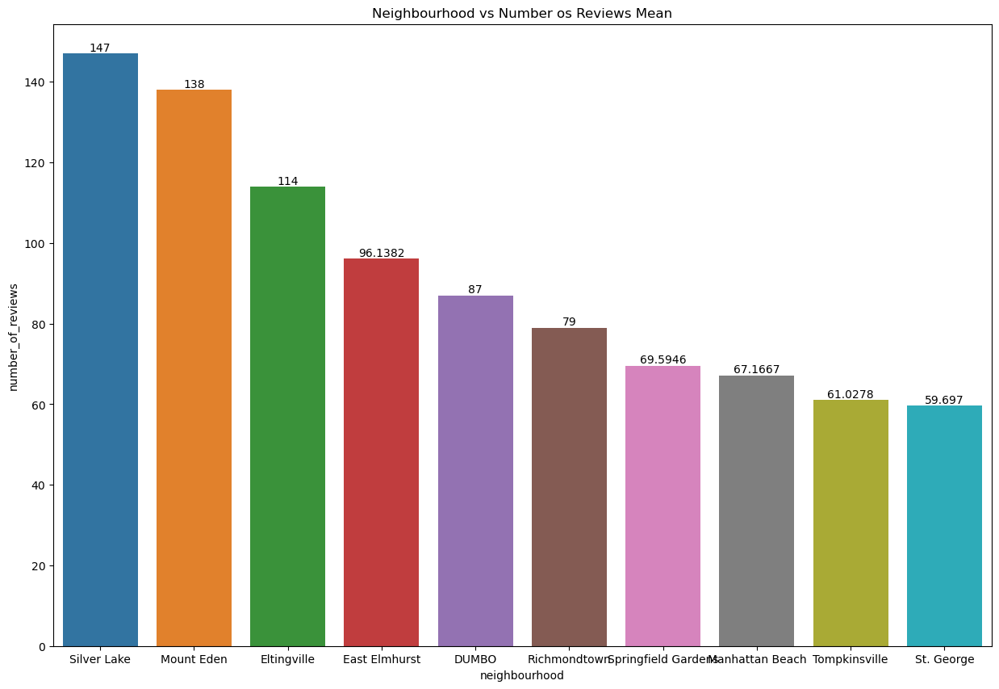

In [28]:
create_sns_bargraph_mean(df_analise, 'neighbourhood', 'number_of_reviews', "Neighbourhood vs Number os Reviews Mean")

# Hipóteses de Negócio

### Hipótese 1: Em média, os aluguéis mais caros da cidade de Nova York estão nas regiões ao entorno do Central Park.

As regiões ao entorno do Central Park são:

- East Harlem 
- Harlem 
- Upper East Side 
- Upper West Side

In [29]:
g1 = df_analise[['neighbourhood','price']].groupby(by='neighbourhood').mean().sort_values(by='price', ascending= False).head(10).reset_index()
g1

,neighbourhood,price
0,Sea Gate,805.00
1,Tribeca,429.07
2,Flatiron District,343.07
3,NoHo,334.19
4,SoHo,311.92
5,Midtown,297.30
6,West Village,275.41
7,Neponsit,274.67
8,Riverdale,269.60
9,Greenwich Village,267.77


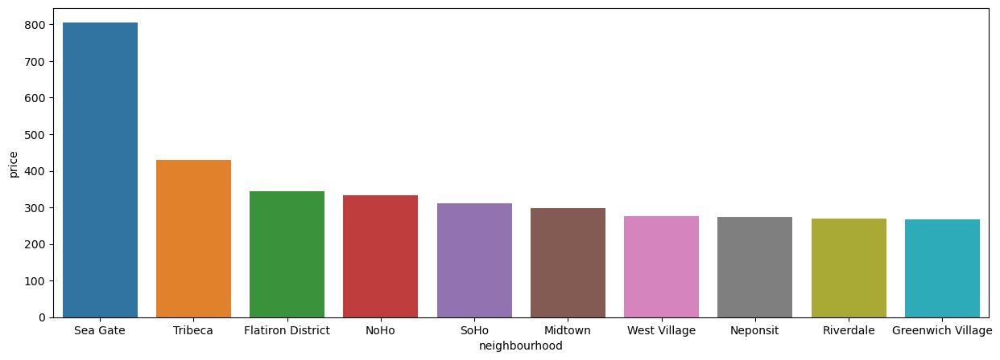

In [30]:
fig= plt.figure(figsize=[15,5])
sns.barplot(x='neighbourhood', y= 'price', data=g1)
plt.show()

##### Como podemos ver a hipotese é falsa, na média os alugueis mais caros são em Sea Gate.

### Hipótese 2: Staten Island tem em média os aluguéis mais baratos

In [31]:
g2=df_analise[['neighbourhood_group','price']].groupby(by='neighbourhood_group').mean().sort_values(by='price', ascending= False).reset_index()
g2

,neighbourhood_group,price
0,Manhattan,190.99
1,Brooklyn,127.55
2,Queens,95.34
3,Staten Island,88.98
4,Bronx,80.63


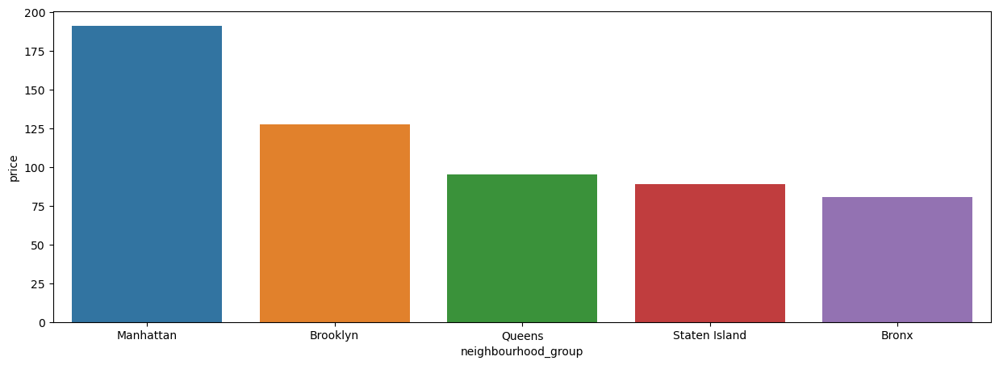

In [32]:
fig= plt.figure(figsize=[15,5])
sns.barplot(x='neighbourhood_group', y= 'price', data=g2)
plt.show()

##### Como podemos ver a hipotese é falsa, na média os alugueis mais baratos são no Bronx. Sendo a média do aluguel de Staten Islande 10% maior que no Bronx.

### Hipótese 3: Quanto mais reviews, menos tempo o imóvel ficou dispónivel

In [33]:
df_analise[['number_of_reviews','availability_365']].groupby(by='number_of_reviews').mean().sort_values(by='availability_365', ascending= False)

,availability_365
number_of_reviews,
352,359.00
332,355.00
454,353.00
597,342.00
404,341.00
...,...
397,35.00
290,26.00
341,25.00


In [34]:
df[['number_of_reviews','availability_365']].corr()

,number_of_reviews,availability_365
number_of_reviews,1.00,0.17
availability_365,0.17,1.00


##### Falso. Ambos os valores apresentam uma baixa correlação.

### Hipótese 4: Hosts com mais de um lugar cobram mais caro os alugúeis do que aqueles que tem apenas um lugar

In [35]:
df_analise[['calculated_host_listings_count','price']].groupby(by='calculated_host_listings_count').mean().sort_values(by='price', ascending= False).reset_index()

,calculated_host_listings_count,price
0,49,626.80
1,11,390.60
2,232,285.39
3,327,270.14
4,12,259.91
5,121,243.40
6,87,216.38
7,14,214.37
8,30,207.00
9,33,200.34


In [36]:
df_analise[['calculated_host_listings_count','price']].corr()

,calculated_host_listings_count,price
calculated_host_listings_count,1.00,0.07
price,0.07,1.00


##### Falso. Ambos os valores apresentam uma baixa correlação. Na média, o número de imóveis que o Host tem, não impacta no preço do aluguel

### Hipótese 5:  A categoria Entire home/apt é a mais cara que qualquer outra categoria, independente da região

In [37]:
g5 = df_analise[['room_type','price']].groupby(by='room_type').mean().sort_values(by='price', ascending= False).reset_index()
g5

,room_type,price
0,Entire home/apt,204.97
1,Private room,86.06
2,Shared room,62.24


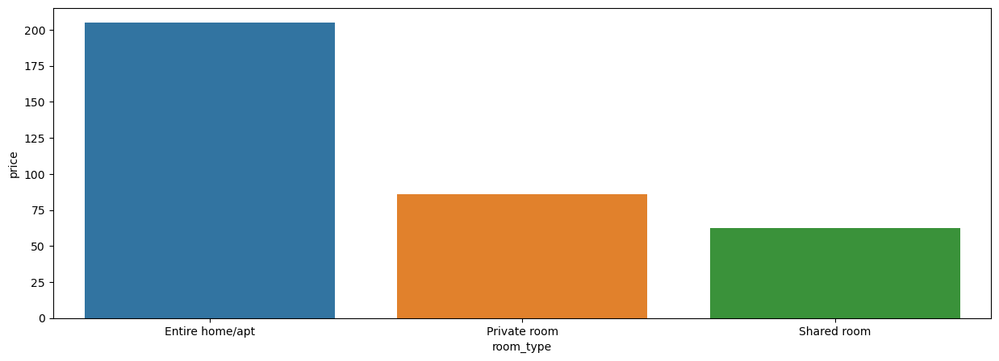

In [38]:
fig= plt.figure(figsize=[15,5])
sns.barplot(x='room_type', y= 'price', data=g5)
plt.show()

##### Verdadeiro, dos 3 tipos, Entire home/apt é o mais caro. Sendo aproximadamente 238% mais caro que o segundo colocado, Private Room

# Resolução do problema de negócio

## Quais são os melhores bairros e tipos de imóveis a serem comprados para termos a maior rentabilidade

#### Como vimos na análise gráfica acima, vamos elencar as melhores caracteristicas:

- Região com maior rentabilidade média: **Manhattan**
- Região com a menor disponibilidade média: **Brooklyn**
- Região com os maiores valores de aluguéis em média: **Manhattan**
- Tipo de quarto com maior rentabilidade média: **Entire home/apt**
- Bairro com maior quantidade de reviews:**Silver Lake - Staten Island**
- Bairro com maior rentabilidade média: **DUMBO - Brooklyn**

#### Nesta análise iremos recomendar a compra de imóveis em dois bairros, sendo esses Manhattan e Brooklyn, para aumentar a diversificação e optando preferencialmente pelos tipos de quarto Entire home/apt. Abaixo os melhores bairros em cada um dos dois Burgos para se adquirir imóveis:

In [39]:
df_analise[['neighbourhood','rentability']][(df_analise['neighbourhood_group'] == 'Manhattan') & (df_analise['room_type'] == 'Entire home/apt')].groupby(by='neighbourhood').mean().sort_values(by='rentability', ascending= False).head(10).reset_index()

,neighbourhood,rentability
0,Civic Center,5030.65
1,Nolita,5023.54
2,Flatiron District,4445.03
3,SoHo,4334.17
4,Greenwich Village,4317.02
5,Gramercy,4289.57
6,Chinatown,4145.74
7,West Village,3948.97
8,Harlem,3925.76
9,Chelsea,3908.52


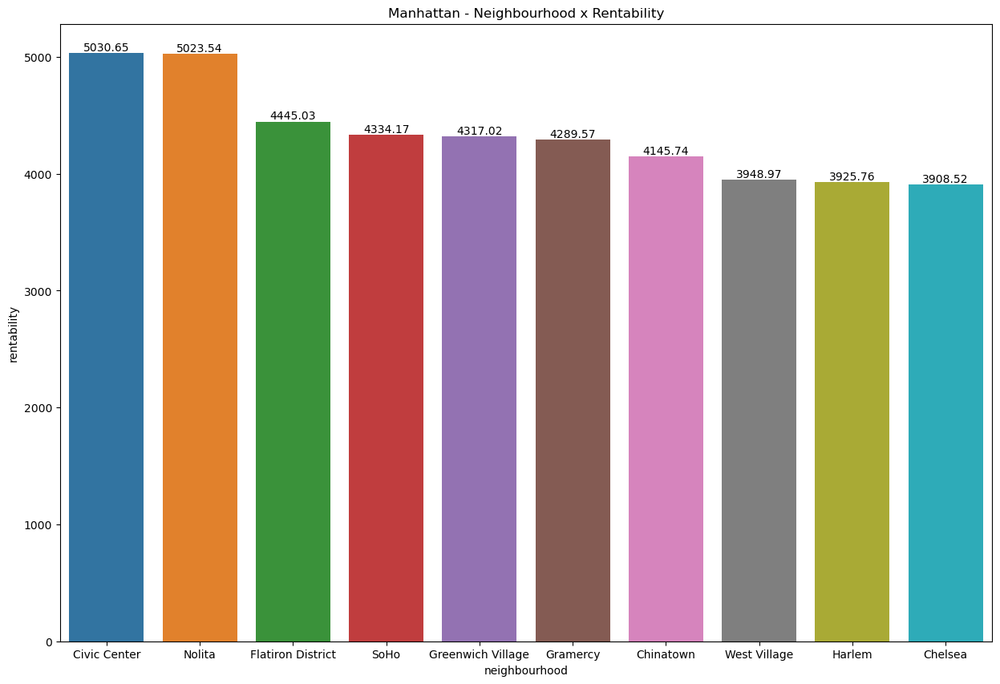

In [40]:
a1 = df_analise[['neighbourhood','rentability']][(df_analise['neighbourhood_group'] == 'Manhattan') & (df_analise['room_type'] == 'Entire home/apt')].reset_index(drop=True)
create_sns_bargraph_mean (a1,'neighbourhood', 'rentability', 'Manhattan - Neighbourhood x Rentability')

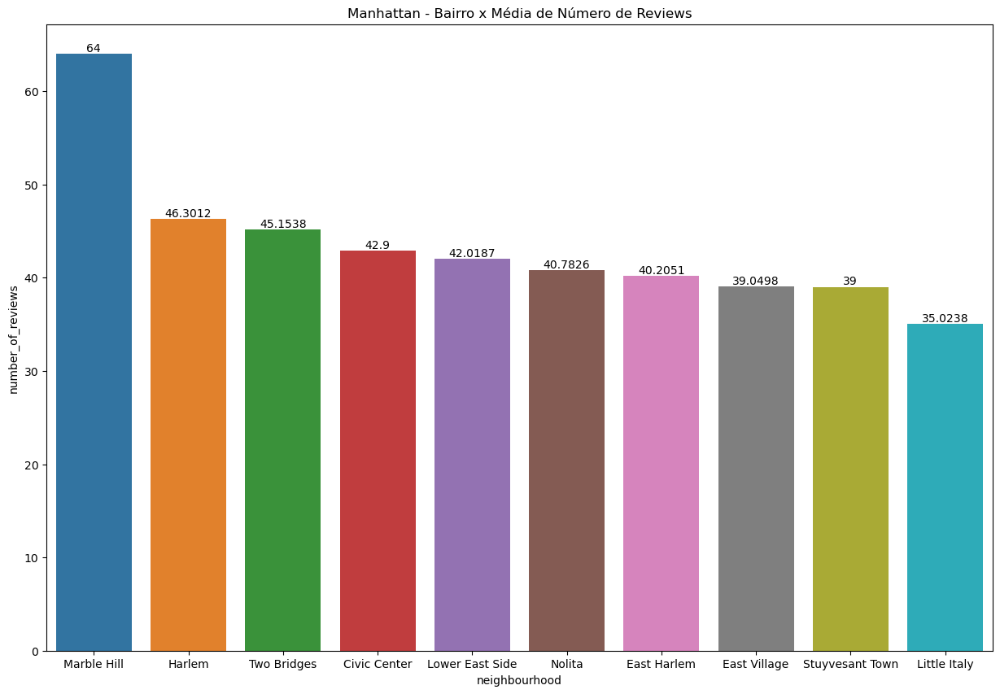

In [41]:
a2 = df_analise[['neighbourhood', 'number_of_reviews']][(df_analise['neighbourhood_group'] == 'Manhattan') & (
                df_analise['room_type'] == 'Entire home/apt')].reset_index(drop=True)
create_sns_bargraph_mean(a2, 'neighbourhood', 'number_of_reviews', 'Manhattan - Bairro x Média de Número de '
                                                                           'Reviews')

### Recomendamos a compra de Entire Home/Apt em Manhattan nos bairros Civic Center e Nolita. Com a adição do Harlem, que figura no top 2 bairros com maior média de reviews e no Top 9 dos com melhor rentabilidade média.

.

In [42]:
df_analise[['neighbourhood','rentability']][(df_analise['neighbourhood_group'] == 'Brooklyn') & (df_analise['room_type'] == 'Entire home/apt')].groupby(by='neighbourhood').mean().sort_values(by='rentability', ascending= False).head(10).reset_index()

,neighbourhood,rentability
0,DUMBO,4116.79
1,Park Slope,4110.58
2,South Slope,3896.35
3,Boerum Hill,3826.92
4,Downtown Brooklyn,3801.20
5,Brooklyn Heights,3773.51
6,Gowanus,3606.49
7,Williamsburg,3546.39
8,Carroll Gardens,3529.47
9,Vinegar Hill,3468.10


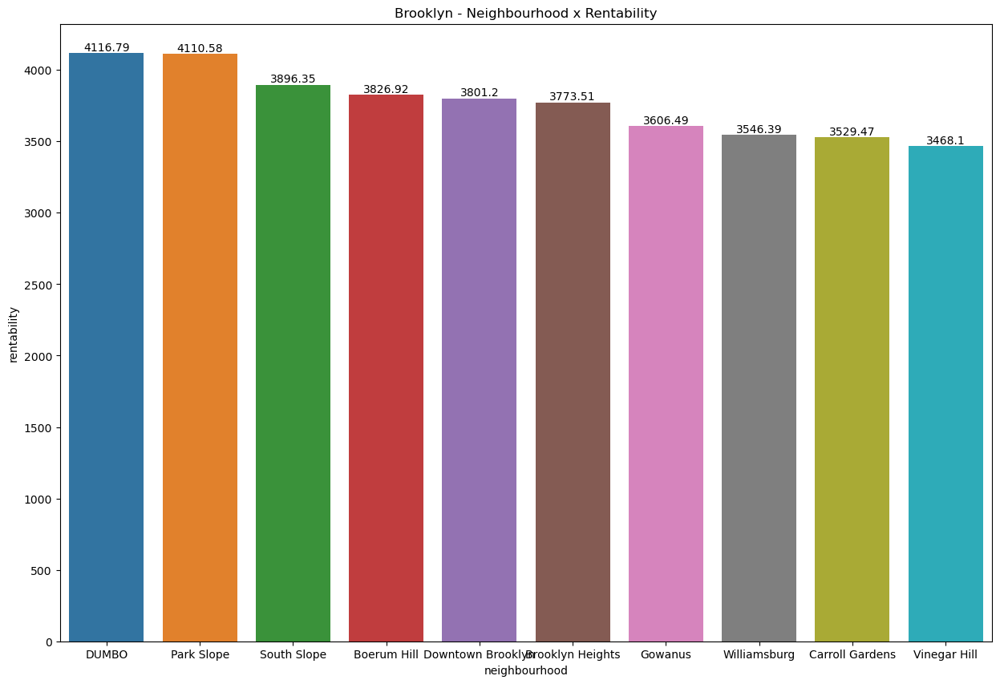

In [43]:
a3 = df_analise[['neighbourhood','rentability']][(df_analise['neighbourhood_group'] == 'Brooklyn') & (df_analise['room_type'] == 'Entire home/apt')].reset_index(drop=True)
create_sns_bargraph_mean (a3,'neighbourhood', 'rentability', 'Brooklyn - Neighbourhood x Rentability')

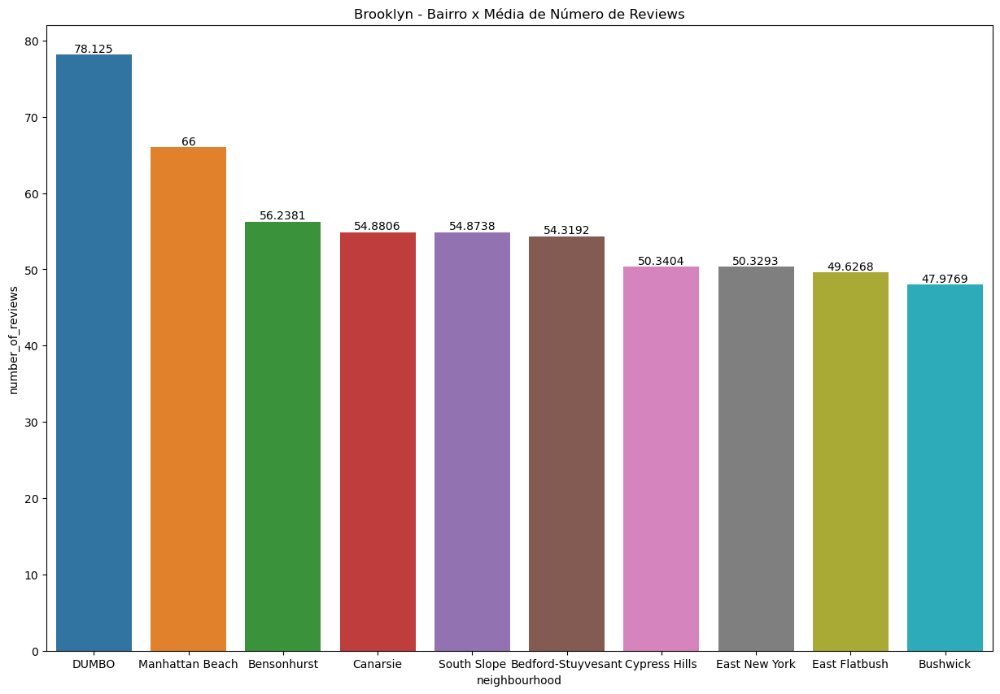

In [44]:
a4 = df_analise[['neighbourhood', 'number_of_reviews']][(df_analise['neighbourhood_group'] == 'Brooklyn') & (
                df_analise['room_type'] == 'Entire home/apt')].reset_index(drop=True)
create_sns_bargraph_mean(a4, 'neighbourhood', 'number_of_reviews', 'Brooklyn - Bairro x Média de Número de '
                                                                           'Reviews')

### Recomendamos a compra de Entire Home/Apt em Brooklyn nos bairros DUMBO e Park Slope. Com a adição de South Slope, que figura no top 5 bairros com maior média de reviews e no Top 3 dos com melhor rentabilidade média.